In [1]:
!pip install pandas_profiling

In [2]:
!pip install lightgbm

In [3]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import ipaddress
import pandas_profiling as pp
%matplotlib inline
from sklearn import preprocessing
plt.rc("font", size=14)
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import warnings
warnings.filterwarnings("ignore")
import time
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import lightgbm as lgb
from lightgbm import LGBMClassifier
import seaborn as sns
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)

In [4]:
df = pd.read_csv(r"C:\Users\Usuario\Desktop\Brian\Cursos\IBM\Data Science\Fraud detection\predict-fraud-using-auto-ai-master\data\fraud_dataset.csv")
print(df.head())
print(df.shape)

   Gender  Married  Dependents  Education  Self_Employed  ApplicantIncome  \
0       1        0           0          1              0             5849   
1       1        1           1          1              1             4583   
2       1        1           0          1              1             3000   
3       1        1           0          0              1             2583   
4       1        0           0          1              0             6000   

   CoapplicantIncome  LoanAmount  Loan_Term  Credit_History_Available  \
0                  0         146        360                         1   
1               1508         128        360                         1   
2                  0          66        360                         1   
3               2358         120        360                         1   
4                  0         141        360                         1   

   Housing  Locality  Fraud_Risk  
0        1         1           0  
1        1         3        

In [5]:
pp.ProfileReport(df)

In [6]:
df_clean = df.drop_duplicates()

In [7]:
pp.ProfileReport(df_clean)

In [8]:
df_cleaner=df_clean.reset_index(drop=True)

In [9]:
pp.ProfileReport(df_cleaner)

In [10]:
df=df_cleaner

In [11]:
count_fraud = len(df[df['Fraud_Risk']==0])
count_non_fraud = len(df[df['Fraud_Risk']==1])
pct_of_non_fraud = count_non_fraud/(count_non_fraud +count_fraud)
print("percentage of non Fraud Risk is", round(pct_of_non_fraud*100,2))
pct_of_fraud = count_fraud/(count_non_fraud +count_fraud)
print("percentage of Fraud Risk", round(pct_of_fraud*100,2))

percentage of non Fraud Risk is 57.89
percentage of Fraud Risk 42.11


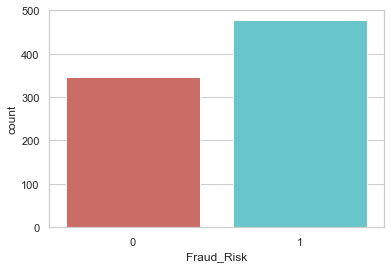

In [12]:
sns.countplot(x='Fraud_Risk',data=df, palette='hls')
plt.show()

In [13]:
df.groupby('Fraud_Risk').mean()

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Term,Credit_History_Available,Housing,Locality
Fraud_Risk,,,,,,,,,,,,
0,0.573487,0.000000,0.311239,0.806916,0.175793,4782.538905,1102.089337,125.665706,346.570605,0.974063,0.700288,2.008646
1,0.851153,0.834382,0.905660,0.777778,0.865828,5530.683438,1774.714885,152.104822,331.849057,0.819706,0.620545,1.958071


In [14]:
df.corr(method ='pearson')

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Term,Credit_History_Available,Housing,Locality,Fraud_Risk
Gender,1.000000,0.356136,0.121846,-0.080807,0.261096,0.009360,0.116479,0.088768,-0.074201,-0.019344,-0.010087,-0.005416,0.310347
Married,0.356136,1.000000,0.374027,-0.032435,0.830580,0.071384,0.104477,0.174644,-0.107768,-0.084514,-0.093652,-0.021410,0.824408
Dependents,0.121846,0.374027,1.000000,-0.024275,0.349777,0.130135,0.025649,0.182078,-0.049344,-0.084198,-0.022426,-0.013231,0.313510
Education,-0.080807,-0.032435,-0.024275,1.000000,-0.027025,0.128295,0.051752,0.155332,0.108766,0.056490,0.001026,-0.102809,-0.035325
Self_Employed,0.261096,0.830580,0.349777,-0.027025,1.000000,0.139222,0.077501,0.230396,-0.104152,-0.048830,-0.103521,-0.048527,0.689243
ApplicantIncome,0.009360,0.071384,0.130135,0.128295,0.139222,1.000000,-0.120696,0.564786,-0.004062,-0.021876,-0.050468,-0.019605,0.065966
CoapplicantIncome,0.116479,0.104477,0.025649,0.051752,0.077501,-0.120696,1.000000,0.165543,-0.054231,-0.035173,-0.018705,0.002418,0.118404
LoanAmount,0.088768,0.174644,0.182078,0.155332,0.230396,0.564786,0.165543,1.000000,0.073898,-0.024577,-0.085464,0.020878,0.163384
Loan_Term,-0.074201,-0.107768,-0.049344,0.108766,-0.104152,-0.004062,-0.054231,0.073898,1.000000,0.075694,0.026242,0.085507,-0.096358
Credit_History_Available,-0.019344,-0.084514,-0.084198,0.056490,-0.048830,-0.021876,-0.035173,-0.024577,0.075694,1.000000,0.017112,-0.004737,-0.238630


In [15]:
X = df[df.columns[0:12]]
y = df[df.columns[12:]]

In [16]:
df.dtypes

Gender                      int64
Married                     int64
Dependents                  int64
Education                   int64
Self_Employed               int64
ApplicantIncome             int64
CoapplicantIncome           int64
LoanAmount                  int64
Loan_Term                   int64
Credit_History_Available    int64
Housing                     int64
Locality                    int64
Fraud_Risk                  int64
dtype: object

In [17]:
df.isna()

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Term,Credit_History_Available,Housing,Locality,Fraud_Risk
0,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
819,False,False,False,False,False,False,False,False,False,False,False,False,False
820,False,False,False,False,False,False,False,False,False,False,False,False,False
821,False,False,False,False,False,False,False,False,False,False,False,False,False
822,False,False,False,False,False,False,False,False,False,False,False,False,False


In [18]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [20]:
print("Train_x Shape :: ", X_train.shape)
print("Train_y Shape :: ", y_train.shape)
print("Test_x Shape :: ", X_test.shape)
print("Test_y Shape :: ", y_test.shape)

Train_x Shape ::  (576, 12)
Train_y Shape ::  (576, 1)
Test_x Shape ::  (248, 12)
Test_y Shape ::  (248, 1)


In [21]:
d_train = lgb.Dataset(X_train, label=y_train)

In [22]:
def LGBM_classifier(features, target):
    """
    To train the LGBM classifier with features and target data
    :param features:
    :param target:
    :return: trained LGBM classifier
    """
    model = LGBMClassifier(metric='binary_logloss', objective='binary')
    model.fit(features, target)
    return model

start = time.time()
trained_model = LGBM_classifier(X_train, y_train.values.ravel())
print("> Completion Time : ", time.time() - start)
print("Trained LGBM model :: ", trained_model)
predictions = trained_model.predict(X_test)

> Completion Time :  0.07579588890075684
Trained LGBM model ::  LGBMClassifier(metric='binary_logloss', objective='binary')


In [23]:
print("Train Accuracy :: ", accuracy_score(y_train, trained_model.predict(X_train)))
print("LGBM Model Test Accuracy is :: ", accuracy_score(y_test, predictions))

Train Accuracy ::  1.0
LGBM Model Test Accuracy is ::  0.9395161290322581


In [24]:
print(" Confusion matrix ", confusion_matrix(y_test, predictions))

 Confusion matrix  [[108   2]
 [ 13 125]]


<AxesSubplot:>

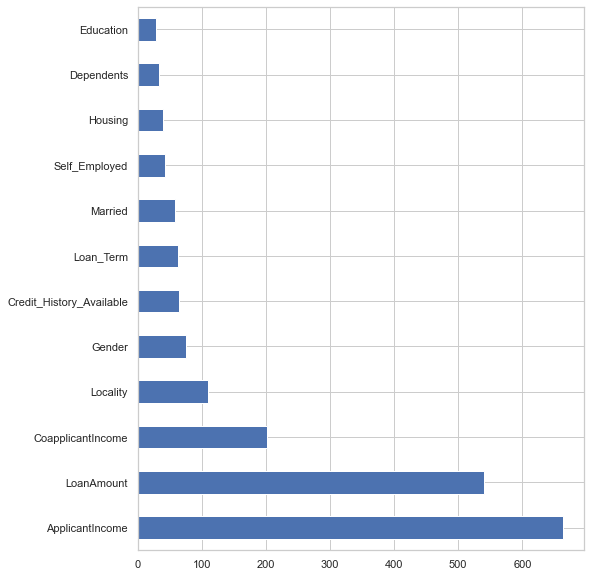

In [25]:
feat_imp = pd.Series(trained_model.feature_importances_, index=X.columns)
feat_imp.nlargest(12).plot(kind='barh', figsize=(8,10))

In [26]:
!pip install shap

In [27]:
import shap
shap.initjs()

In [28]:
shap_values = shap.TreeExplainer(trained_model.booster_).shap_values(X_train)

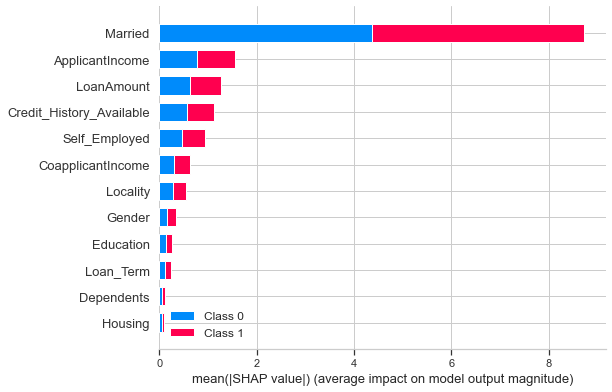

In [29]:
shap.summary_plot(shap_values, X_train)